In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import font_manager
import rasterio as rio
import rioxarray as rxr
import pcxarray as pcx
from glob import glob
import geopandas as gpd

font_path = '/home/dhester/.fonts/InterVariable.ttf'
font_manager.fontManager.addfont(font_path)
prop = font_manager.FontProperties(fname=font_path)

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = prop.get_name()

In [19]:
selected_ids =[
    '095222',
    '139008',
    '149308',
    '210838',
    '037717',
    '042005'
]
samples = gpd.read_parquet('../data/s2flow-s2naip/samples.par')
selected_samples = samples.loc[samples['id'].isin(selected_ids)]

In [20]:
selected_samples

,geometry,id,split,input_path,target_path
37717,POINT (1419174.136 2383275.029),037717,train,sentinel2/037717.tif,naip/037717.tif
42005,POINT (-1301567.245 1689659.15),042005,train,sentinel2/042005.tif,naip/042005.tif
95222,POINT (1353279.655 1279733.747),095222,train,sentinel2/095222.tif,naip/095222.tif
139008,POINT (1356331.149 1954627.535),139008,train,sentinel2/139008.tif,naip/139008.tif
149308,POINT (143693.559 2269891.422),149308,train,sentinel2/149308.tif,naip/149308.tif
210838,POINT (1199746.981 2130042.011),210838,train,sentinel2/210838.tif,naip/210838.tif


In [57]:
def safe_prepare(query_dict):
    try:
        return pcx.query_and_prepare(**query_dict)
    except Exception as e:
        # print(f"Error preparing data for query {query_dict}: {e}")
        return None

all_naip_imgs =[[safe_prepare(dict(
    collections=['naip'],
    geometry=selected_sample.geometry.buffer(320).envelope,
    datetime=str(year),
    all_touched=True,
    crs=selected_samples.crs,
    target_resolution=1.0,
    resampling_method='lanczos',
)) for _, selected_sample in selected_samples.iterrows()] for year in range(2010, 2024)]

/home/dhester/s2flow/.venv/lib/python3.13/site-packages/pcxarray/query.py:157: UserWarning: No items found for the given query. Returning empty GeoDataFrame.
  warn("No items found for the given query. Returning empty GeoDataFrame.")
/home/dhester/s2flow/.venv/lib/python3.13/site-packages/pcxarray/query.py:157: UserWarning: No items found for the given query. Returning empty GeoDataFrame.
  warn("No items found for the given query. Returning empty GeoDataFrame.")
/home/dhester/s2flow/.venv/lib/python3.13/site-packages/pcxarray/query.py:157: UserWarning: No items found for the given query. Returning empty GeoDataFrame.
  warn("No items found for the given query. Returning empty GeoDataFrame.")
/home/dhester/s2flow/.venv/lib/python3.13/site-packages/pcxarray/query.py:157: UserWarning: No items found for the given query. Returning empty GeoDataFrame.
  warn("No items found for the given query. Returning empty GeoDataFrame.")
/home/dhester/s2flow/.venv/lib/python3.13/site-packages/pcxarray

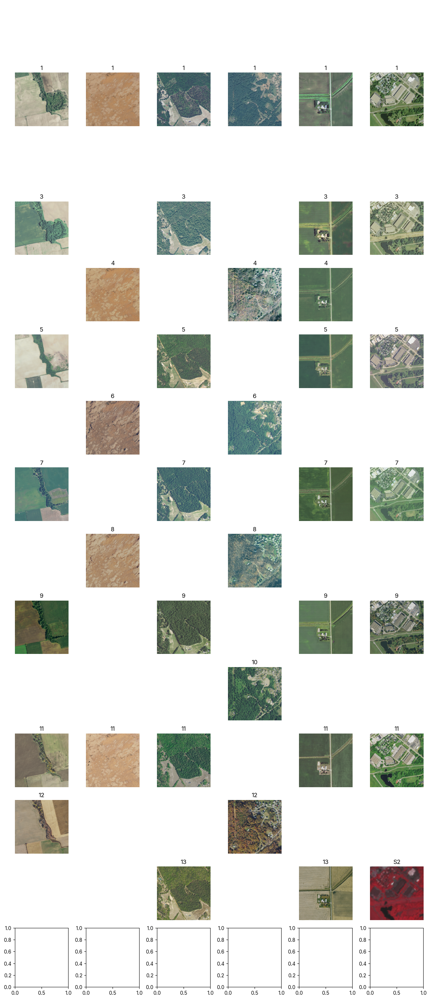

In [60]:
# visualize some samples
fig, axes = plt.subplots(15, len(selected_ids), figsize=(len(selected_ids)*2, 14 * 2), constrained_layout=True)
for i, naip_imgs in enumerate(all_naip_imgs):
    for j, naip_img in enumerate(naip_imgs):
        ax = axes[i, j]
        if naip_img is not None:
            # naip_img = naip_img.rio.clip_box(*selected_samples.iloc[i].geometry.envelope.bounds)
            # naip_img = naip_img / 255.0
            rgb = naip_img.isel(band=[0, 1, 2]).transpose('y', 'x', 'band').values
            rgb = np.clip(rgb / 255.0, 0, 1)
            ax.imshow(rgb)
            ax.set_title(f"{i}", fontsize=12)
        ax.axis('off')

# now plot s2 images at the bottom
for _, selected_sample in selected_samples.iterrows():
    s2_img_path = '../data/s2flow-s2naip/' + selected_sample['input_path']
    try:
        s2_img = rxr.open_rasterio(s2_img_path, masked=True)
    except Exception as e:
        s2_img = None
    if s2_img is not None:
        rgb = s2_img.isel(band=[3, 2, 1]).transpose('y', 'x', 'band').values
        rgb = np.clip(rgb / 10000.0, 0, 1)
        ax.imshow(rgb)
        ax.set_title(f"S2", fontsize=12)
    ax.axis('off')


In [67]:
naip_img_selected = [
    all_naip_imgs[12][0],
    all_naip_imgs[4][1],
    all_naip_imgs[9][2],
    all_naip_imgs[10][3],
    all_naip_imgs[13][4],
    all_naip_imgs[9][5],
]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.4396..1.3776].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.436..1.3848].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.2588..1.6024].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.2268..1.6104].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0484..1.3324].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0364..1.3552].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0732..1.3076].
Clipping input data to the valid ra

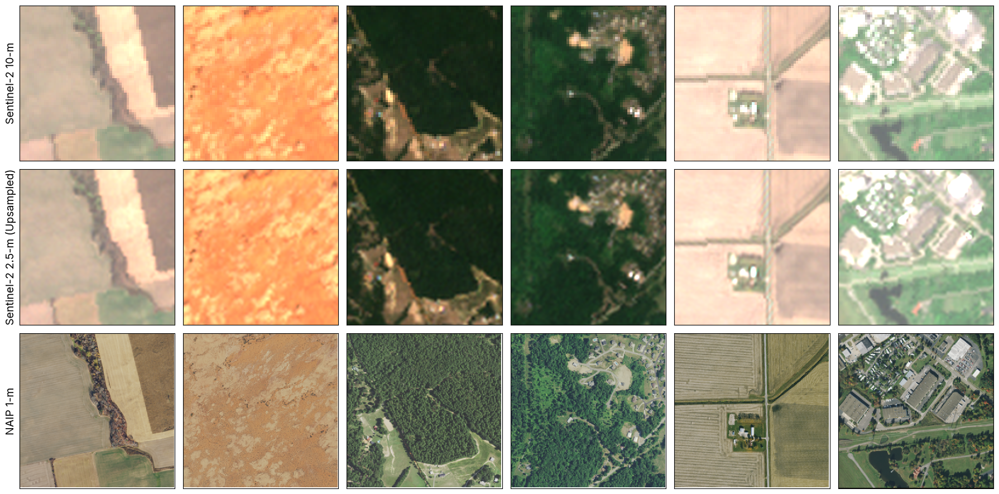

In [95]:


fig, ax = plt.subplots(3, 6, figsize=(18, 9))
for i in range(6):
    naip_img = naip_img_selected[i]
    # naip_img.rio.write_crs(naip_img.rio.crs, inplace=True)
    # naip_img = naip_img.rio.reproject("EPSG:3857", resampling=rio.enums.Resampling.bilinear)
    
    naip_img = naip_img.isel(band=[0, 1, 2])
    naip_img_2_5m = naip_img.rio.reproject(naip_img.rio.crs, resolution=(2.5, 2.5), resampling=rio.enums.Resampling.lanczos)
    
    s2_img_path = selected_samples.iloc[i]['input_path']
    s2_img_path = '../data/s2flow-s2naip/' + s2_img_path
    
    s2_img_2_5m = rxr.open_rasterio(s2_img_path).isel(band=[0, 1, 2])
    s2_img_10m = s2_img_2_5m.rio.reproject(s2_img_2_5m.rio.crs, resolution=(10, 10), resampling=rio.enums.Resampling.lanczos)
    
    ax[0, i].imshow(s2_img_10m.transpose('y', 'x', 'band').values / 2500.0)
    ax[1, i].imshow(s2_img_2_5m.transpose('y', 'x', 'band').values / 2500.0)
    ax[2, i].imshow(naip_img_2_5m.transpose('y', 'x', 'band').values / 255.0)
    # ax[3, i].imshow(naip_img.transpose('y', 'x', 'band').values / 255.0)
    
    # ax[0, i].set_title(f"Sample ID: {selected_samples.iloc[i]['id']}", fontsize=10)
    
    for j in range(3):
        ax[j, i].set_xticks([])
        ax[j, i].set_yticks([])


ax[0, 0].set_ylabel('Sentinel-2 10-m', fontsize=14)
ax[1, 0].set_ylabel('Sentinel-2 2.5-m (Upsampled)', fontsize=14)
ax[2, 0].set_ylabel('NAIP 1-m', fontsize=14)

fig.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1192..1.1244].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1325..1.1075].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1215..1.041].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3157142857142857..1.292857142857143].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.21085714285714285..1.1342857142857143].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.22485714285714287..1.1668571428571428].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for i

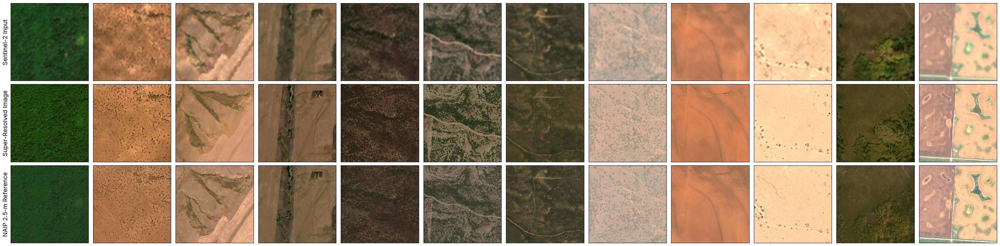

In [147]:
pred_imgs = glob('../runs/s2flow_sr_eval_test/sr_outputs/*.tif')

fig, ax = plt.subplots(3, 12, figsize=(32, 8))

gains = [
    1500,
    2500,
    2000,
    4000,
    3500,
    3000,
    2500,
    3000,
    2500,
    3500,
    2500,
    2500,
    
]

for i in range(12):
    sample_id = pred_imgs[i].split('/')[-1].split('.')[0]
    pred_img = rxr.open_rasterio(pred_imgs[i]).isel(band=[0, 1, 2])
    
    naip_sample_path = samples.loc[samples['id'] == sample_id, 'target_path'].iloc[0]
    naip_img = rxr.open_rasterio('../data/s2flow-s2naip/' + naip_sample_path).isel(band=[0, 1, 2])
    
    s2_sample_path = samples.loc[samples['id'] == sample_id, 'input_path'].iloc[0]
    s2_img = rxr.open_rasterio('../data/s2flow-s2naip/' + s2_sample_path).isel(band=[0, 1, 2])
    
    ax[0, i].imshow(s2_img.transpose('y', 'x', 'band').values / gains[i])
    ax[1, i].imshow(pred_img.transpose('y', 'x', 'band').values / gains[i])
    ax[2, i].imshow(naip_img.transpose('y', 'x', 'band').values / gains[i])
    
    for j in range(3):
        ax[j, i].set_xticks([])
        ax[j, i].set_yticks([])

ax[0, 0].set_ylabel('Sentinel-2 Input', fontsize=14)
ax[1, 0].set_ylabel('Super-Resolved Image', fontsize=14)
ax[2, 0].set_ylabel('NAIP 2.5-m Reference', fontsize=14)

fig.tight_layout()
    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3576666666666667..1.7523333333333333].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.206..2.857142857142857].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.364].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.2317142857142857..1.106].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5672..1.8032].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.57..1.468].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.6336..1.424

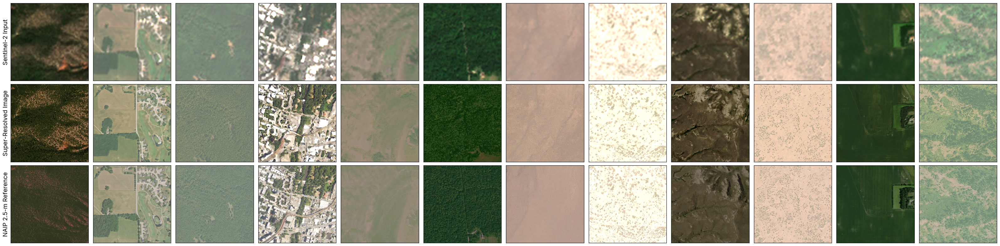

In [152]:
pred_imgs = glob('../runs/s2flow_sr_eval_test/sr_outputs/*.tif')

fig, ax = plt.subplots(3, 12, figsize=(32, 8))

gains = [
    2500,
    3000,
    2500,
    3500,
    3500,
    1500,
    3500,
    2500,
    4000,
    3000,
    2000,
    2500,
    
]

for i in range(12):
    sample_id = pred_imgs[i+12].split('/')[-1].split('.')[0]
    pred_img = rxr.open_rasterio(pred_imgs[i+12]).isel(band=[0, 1, 2])
    
    naip_sample_path = samples.loc[samples['id'] == sample_id, 'target_path'].iloc[0]
    naip_img = rxr.open_rasterio('../data/s2flow-s2naip/' + naip_sample_path).isel(band=[0, 1, 2])
    
    s2_sample_path = samples.loc[samples['id'] == sample_id, 'input_path'].iloc[0]
    s2_img = rxr.open_rasterio('../data/s2flow-s2naip/' + s2_sample_path).isel(band=[0, 1, 2])
    
    ax[0, i].imshow(s2_img.transpose('y', 'x', 'band').values / gains[i])
    ax[1, i].imshow(pred_img.transpose('y', 'x', 'band').values / gains[i])
    ax[2, i].imshow(naip_img.transpose('y', 'x', 'band').values / gains[i])
    
    for j in range(3):
        ax[j, i].set_xticks([])
        ax[j, i].set_yticks([])

ax[0, 0].set_ylabel('Sentinel-2 Input', fontsize=14)
ax[1, 0].set_ylabel('Super-Resolved Image', fontsize=14)
ax[2, 0].set_ylabel('NAIP 2.5-m Reference', fontsize=14)

fig.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5236666666666666..1.496].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.44866666666666666..1.3373333333333333].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5303333333333333..1.212].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.8736].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0176..1.5408].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.6292].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5072..1.

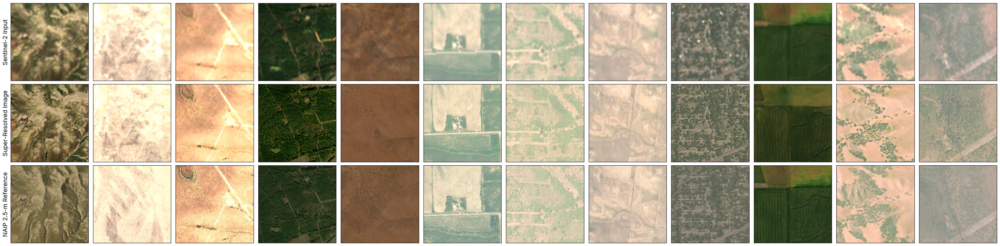

In [154]:
pred_imgs = glob('../runs/s2flow_sr_eval_test/sr_outputs/*.tif')

fig, ax = plt.subplots(3, 12, figsize=(32, 8))

gains = [
    3000,
    3000,
    2500,
    1500,
    3500,
    2500,
    2500,
    2500,
    4000,
    2500,
    2500,
    2500,
    
]

for i in range(12):
    sample_id = pred_imgs[i+24].split('/')[-1].split('.')[0]
    pred_img = rxr.open_rasterio(pred_imgs[i+24]).isel(band=[0, 1, 2])
    
    naip_sample_path = samples.loc[samples['id'] == sample_id, 'target_path'].iloc[0]
    naip_img = rxr.open_rasterio('../data/s2flow-s2naip/' + naip_sample_path).isel(band=[0, 1, 2])
    
    s2_sample_path = samples.loc[samples['id'] == sample_id, 'input_path'].iloc[0]
    s2_img = rxr.open_rasterio('../data/s2flow-s2naip/' + s2_sample_path).isel(band=[0, 1, 2])
    
    ax[0, i].imshow(s2_img.transpose('y', 'x', 'band').values / gains[i])
    ax[1, i].imshow(pred_img.transpose('y', 'x', 'band').values / gains[i])
    ax[2, i].imshow(naip_img.transpose('y', 'x', 'band').values / gains[i])
    
    for j in range(3):
        ax[j, i].set_xticks([])
        ax[j, i].set_yticks([])

ax[0, 0].set_ylabel('Sentinel-2 Input', fontsize=14)
ax[1, 0].set_ylabel('Super-Resolved Image', fontsize=14)
ax[2, 0].set_ylabel('NAIP 2.5-m Reference', fontsize=14)

fig.tight_layout()